              Date/Time  TZ1 WORK:Zone People Occupant Count [](TimeStep)  \
0       01/01  00:15:00                                               0.0   
1       01/01  00:30:00                                               0.0   
2       01/01  00:45:00                                               0.0   
3       01/01  01:00:00                                               0.0   
4       01/01  01:15:00                                               0.0   
...                 ...                                               ...   
35035   12/31  23:00:00                                               0.0   
35036   12/31  23:15:00                                               0.0   
35037   12/31  23:30:00                                               0.0   
35038   12/31  23:45:00                                               0.0   
35039   12/31  24:00:00                                               0.0   

       TZ2 MISC:Zone People Occupant Count [](TimeStep)  \
0               

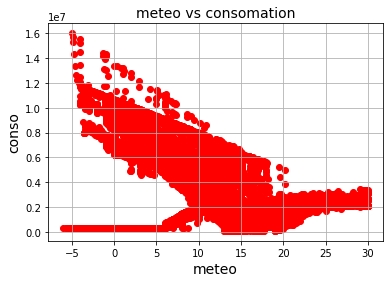

In [78]:
import pandas as pd 
import matplotlib.pyplot as plt
import plotly.express as px

data = pd.read_csv('data_clim3.csv')
df = pd.DataFrame(data, columns=['Date/Time',
                                 'TZ1 WORK:Zone People Occupant Count [](TimeStep)',
                                 'TZ2 MISC:Zone People Occupant Count [](TimeStep)',
                                 'Environment:Site Outdoor Air Drybulb Temperature [C](TimeStep)',
                                 'TZ1 WORK:Zone Air Temperature [C](TimeStep)',
                                 'TZ2 MISC:Zone Air Temperature [C](TimeStep)',
                                 'TZ1 WORK:Zone Thermostat Heating Setpoint Temperature [C](TimeStep)',
                                 'TZ2 MISC:Zone Thermostat Heating Setpoint Temperature [C](TimeStep)',
                                 'Electricity:Facility [J](TimeStep) '])
print (df)

plt.scatter(df['Environment:Site Outdoor Air Drybulb Temperature [C](TimeStep)'], df['Electricity:Facility [J](TimeStep) '], color='red')
plt.title('meteo vs consomation', fontsize=14)
plt.xlabel('meteo', fontsize=14)
plt.ylabel('conso', fontsize=14)
plt.grid(True)
plt.show()

In [79]:
data.head()

,Date/Time,Environment:Site Outdoor Air Drybulb Temperature [C](TimeStep),TZ2 MISC:Zone People Occupant Count [](TimeStep),TZ1 WORK:Zone People Occupant Count [](TimeStep),TZ1 WORK:Zone Air Temperature [C](TimeStep),TZ1 WORK:Zone Thermostat Heating Setpoint Temperature [C](TimeStep),TZ1 WORK:Zone Thermostat Cooling Setpoint Temperature [C](TimeStep),TZ2 MISC:Zone Air Temperature [C](TimeStep),TZ2 MISC:Zone Thermostat Heating Setpoint Temperature [C](TimeStep),TZ2 MISC:Zone Thermostat Cooling Setpoint Temperature [C](TimeStep),Electricity:Facility [J](TimeStep)
0,01/01 00:15:00,5.525,0.0,0.0,10.954265,5.0,22.5,11.702454,5.0,35.0,296776.445126
1,01/01 00:30:00,4.650,0.0,0.0,10.836157,5.0,22.5,11.596719,5.0,35.0,296776.445126
2,01/01 00:45:00,3.775,0.0,0.0,10.702856,5.0,22.5,11.474617,5.0,35.0,296776.445126
3,01/01 01:00:00,2.900,0.0,0.0,10.549633,5.0,22.5,11.335958,5.0,35.0,296776.445126
4,01/01 01:15:00,3.250,0.0,0.0,10.460999,5.0,22.5,11.247975,5.0,35.0,296776.445126


In [80]:
data.tail()

,Date/Time,Environment:Site Outdoor Air Drybulb Temperature [C](TimeStep),TZ2 MISC:Zone People Occupant Count [](TimeStep),TZ1 WORK:Zone People Occupant Count [](TimeStep),TZ1 WORK:Zone Air Temperature [C](TimeStep),TZ1 WORK:Zone Thermostat Heating Setpoint Temperature [C](TimeStep),TZ1 WORK:Zone Thermostat Cooling Setpoint Temperature [C](TimeStep),TZ2 MISC:Zone Air Temperature [C](TimeStep),TZ2 MISC:Zone Thermostat Heating Setpoint Temperature [C](TimeStep),TZ2 MISC:Zone Thermostat Cooling Setpoint Temperature [C](TimeStep),Electricity:Facility [J](TimeStep)
35035,12/31 23:00:00,0.100,0.0,0.0,8.479123,5.0,22.5,9.440002,5.0,35.0,296776.445126
35036,12/31 23:15:00,0.425,0.0,0.0,8.488088,5.0,22.5,9.438068,5.0,35.0,296776.445126
35037,12/31 23:30:00,0.750,0.0,0.0,8.504096,5.0,22.5,9.440890,5.0,35.0,296776.445126
35038,12/31 23:45:00,1.075,0.0,0.0,8.535295,5.0,22.5,9.454298,5.0,35.0,296776.445126
35039,12/31 24:00:00,1.400,0.0,0.0,8.583944,5.0,22.5,9.483323,5.0,35.0,296776.445126


In [81]:

fig = px.line(df, x = 'Date/Time', y = 'Environment:Site Outdoor Air Drybulb Temperature [C](TimeStep)', title='outdoor temperature')
fig.add_scatter(x=df['Date/Time'], y=df['TZ1 WORK:Zone Air Temperature [C](TimeStep)'], mode='lines')
fig.add_scatter(x=df['Date/Time'], y=df['TZ1 WORK:Zone People Occupant Count [](TimeStep)'], mode='lines')
fig.add_scatter(x=df['Date/Time'], y=df['TZ2 MISC:Zone People Occupant Count [](TimeStep)'], mode='lines')
fig.show()

fig2 = px.line(df, x = 'Date/Time', y = 'Electricity:Facility [J](TimeStep) ', title='Consomation énergetiquee')
fig2.show()

In [82]:
from sklearn import linear_model
import statsmodels.api as sm

X = df[['Environment:Site Outdoor Air Drybulb Temperature [C](TimeStep)',
        'TZ1 WORK:Zone People Occupant Count [](TimeStep)',
        'TZ2 MISC:Zone People Occupant Count [](TimeStep)',
        'TZ1 WORK:Zone Air Temperature [C](TimeStep)',
        'TZ2 MISC:Zone Air Temperature [C](TimeStep)',
        'TZ1 WORK:Zone Thermostat Heating Setpoint Temperature [C](TimeStep)',
        'TZ2 MISC:Zone Thermostat Heating Setpoint Temperature [C](TimeStep)']]
Y = df['Electricity:Facility [J](TimeStep) ']

# with sklearn
regr = linear_model.LinearRegression()
regr.fit(X.dropna(), Y.dropna())

print('Intercept: \n', regr.intercept_)
print('Coefficients: \n', regr.coef_)



Intercept: 
 -2740434.6582411607
Coefficients: 
 [ -102637.23236524  -132249.85791314    67794.44850433  1703027.37163248
 -1133348.32323265  -248198.90880675   109479.39774071]


In [83]:
X2 = df[['Environment:Site Outdoor Air Drybulb Temperature [C](TimeStep)',
        'TZ1 WORK:Zone Air Temperature [C](TimeStep)',
        'TZ2 MISC:Zone Air Temperature [C](TimeStep)',
        'TZ1 WORK:Zone Thermostat Heating Setpoint Temperature [C](TimeStep)',
        'TZ2 MISC:Zone Thermostat Heating Setpoint Temperature [C](TimeStep)']]
Y2 = df['Electricity:Facility [J](TimeStep) ']

# with sklearn
regr2 = linear_model.LinearRegression()
regr2.fit(X2, Y2)

print('Intercept: \n', regr2.intercept_)
print('Coefficients: \n', regr2.coef_)

Intercept: 
 -1188395.4521809383
Coefficients: 
 [  -91353.24514214  1633047.07291896 -1189007.11072573  -401429.88948199
   244817.70125084]


In [84]:
# with statsmodels
X = sm.add_constant(X) # adding a constant
 
model = sm.OLS(Y, X).fit()
print_model = model.summary()
predictions_stat = model.predict(X) 
print(print_model)


                                     OLS Regression Results                                    
Dep. Variable:     Electricity:Facility [J](TimeStep)    R-squared:                       0.708
Model:                                             OLS   Adj. R-squared:                  0.708
Method:                                  Least Squares   F-statistic:                 1.214e+04
Date:                                 Wed, 24 Mar 2021   Prob (F-statistic):               0.00
Time:                                         17:15:25   Log-Likelihood:            -5.4050e+05
No. Observations:                                35040   AIC:                         1.081e+06
Df Residuals:                                    35032   BIC:                         1.081e+06
Df Model:                                            7                                         
Covariance Type:                             nonrobust                                         
                                        

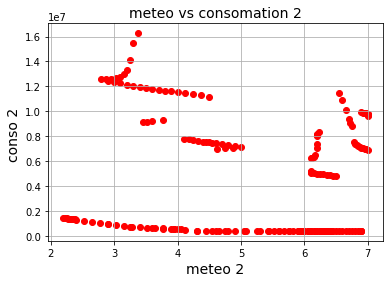

In [85]:
data2 = pd.read_csv('jour.csv')

df2 = pd.DataFrame(data2, columns=['Date/Time',
                                  'Environment:Site Outdoor Air Drybulb Temperature [C](TimeStep)',
                                  'TZ1 WORK:Zone People Occupant Count [](TimeStep)',
                                  'TZ2 MISC:Zone People Occupant Count [](TimeStep)',
                                  'TZ1 WORK:Zone Air Temperature [C](TimeStep)',
                                  'TZ2 MISC:Zone Air Temperature [C](TimeStep)',
                                  'TZ1 WORK:Zone Thermostat Heating Setpoint Temperature [C](TimeStep)',
                                  'TZ2 MISC:Zone Thermostat Heating Setpoint Temperature [C](TimeStep)',
                                  'Electricity:Facility [J](TimeStep) '])
X2 = df2[['Environment:Site Outdoor Air Drybulb Temperature [C](TimeStep)',
        'TZ1 WORK:Zone People Occupant Count [](TimeStep)',
        'TZ2 MISC:Zone People Occupant Count [](TimeStep)',
        'TZ1 WORK:Zone Air Temperature [C](TimeStep)',
        'TZ2 MISC:Zone Air Temperature [C](TimeStep)',
        'TZ1 WORK:Zone Thermostat Heating Setpoint Temperature [C](TimeStep)',
        'TZ2 MISC:Zone Thermostat Heating Setpoint Temperature [C](TimeStep)']]
y_test = df2['Electricity:Facility [J](TimeStep) ']

X3 = df2[['Environment:Site Outdoor Air Drybulb Temperature [C](TimeStep)',
        'TZ1 WORK:Zone Air Temperature [C](TimeStep)',
        'TZ2 MISC:Zone Air Temperature [C](TimeStep)',
        'TZ1 WORK:Zone Thermostat Heating Setpoint Temperature [C](TimeStep)',
        'TZ2 MISC:Zone Thermostat Heating Setpoint Temperature [C](TimeStep)']]
y_test = df2['Electricity:Facility [J](TimeStep) ']

plt.scatter(df2['Environment:Site Outdoor Air Drybulb Temperature [C](TimeStep)'], df2['Electricity:Facility [J](TimeStep) '], color='red')
plt.title('meteo vs consomation 2', fontsize=14)
plt.xlabel('meteo 2', fontsize=14)
plt.ylabel('conso 2 ', fontsize=14)
plt.grid(True)
plt.show()

[ 1792634.51073079  1704751.28998457  1369833.67837804   999267.72082779
   776093.853354     844593.13679333  1030211.19166617  1227290.48678539
  1352967.68237512  1402293.18320838  1428915.21656381  1460408.02147216
  1495711.0192805   1523765.64906762  1547700.77261022  1570422.50277177
  1591680.83372166  1605172.8648219   1615268.44701622  1624196.45488659
  1632518.95111657  1640529.62563409  1648404.06071014  1656207.35832609
  1733317.30517601  1788300.57706318  7033133.9688195  10413367.37715716
 12165819.62191265 13010714.78115088 13493814.73511677 13357721.59199865
 13179482.9834558  13055051.97636742 12969800.0634951  12904014.23566103
 12809860.0556724  12709977.87124928 12630325.69865324 12571569.41820622
 12504752.91101055 12433856.70920588 12366195.233878   12304104.80972476
 12246383.01127511 12191619.40154918 12139362.79414803 12089372.2493788
  7354640.41147634  4897077.72369105  4432684.94017453  4382792.97661992
  4378037.18596289  4375210.40993876  4372725.935760

Text(0, 0.5, 'Predicted Y (occ-)')

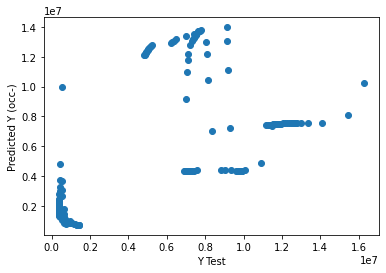

In [86]:
predictions_sklearn2 = regr2.predict(X3)
print(predictions_sklearn2)

plt.scatter(y_test,abs(predictions_sklearn2))
plt.xlabel('Y Test')
plt.ylabel('Predicted Y (occ-)')

In [87]:
predictions_sklearn = regr.predict(X2)
#print(predictions_sklearn)
fig3 = px.line(df2, x = 'Date/Time', y = df2['Electricity:Facility [J](TimeStep) '], title='prédiction de la consomation énergetique')
fig3.update_traces(name='Conso réel', showlegend = True)
fig3.add_scatter(x=df2['Date/Time'], y=abs(predictions_sklearn2), name='conso OCC-',mode='lines')
fig3.add_scatter(x=df2['Date/Time'], y=abs(predictions_sklearn),name='conso OCC+', mode='lines')
fig3.add_scatter(x=df2['Date/Time'], y=predictions_stat, name='conso SM',mode='lines')
fig3.show()

Text(0, 0.5, 'Predicted Y')

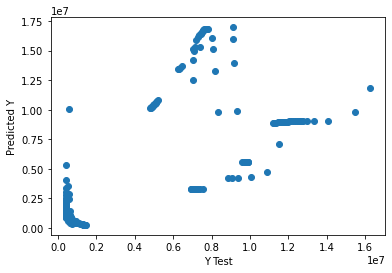

In [88]:
plt.scatter(y_test,abs(predictions_sklearn))
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')


C:\Users\ykaddour\Miniconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



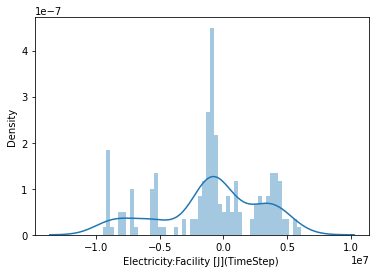

In [89]:
import seaborn as sns
sns.distplot((y_test-abs(predictions_sklearn)),bins=50);


C:\Users\ykaddour\Miniconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



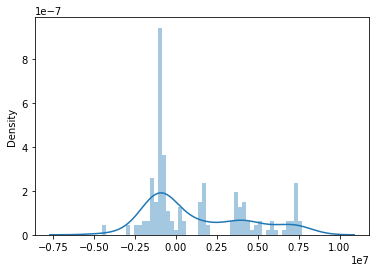

In [90]:
sns.distplot((y_test-abs(predictions_stat)),bins=50);

In [91]:
print(y_test.mean())
print(predictions_sklearn.mean())
print(predictions_sklearn2.mean())

4570591.523638801
5552881.107172464
5226203.2630220195


In [92]:
from sklearn.metrics import mean_squared_error
from prettytable import PrettyTable
MSE_sk = mean_squared_error(y_test, predictions_sklearn)
MSE_sklearn_occ = mean_squared_error(y_test, predictions_sklearn2)
x = PrettyTable(['Models', 'MSE'])

x.add_row(['Linear Regression (avec occupation)', MSE_sk])
x.add_row(['Linear Regression (sans occupation)', MSE_sklearn_occ])
print(x)

+-------------------------------------+--------------------+
|                Models               |        MSE         |
+-------------------------------------+--------------------+
| Linear Regression (avec occupation) | 16524538234041.225 |
| Linear Regression (sans occupation) | 15025233371333.049 |
+-------------------------------------+--------------------+


In [93]:
fig3 = px.line( df2, x = 'Date/Time', y = abs(y_test-predictions_sklearn2) , title='Erreur quadratique ')
fig3.update_traces(name='SK_model', showlegend = True)
fig3.add_scatter(x=df2['Date/Time'], y=abs(y_test-predictions_sklearn),name='SK_OCC', mode='lines')
fig3.add_scatter(x=df2['Date/Time'], y=abs(predictions_sklearn), name='consomation energetique prédite',mode='lines')

fig3.show()

In [94]:
import datetime
import numpy as np
np.arange('2018-01-01T00:00', '2018-01-07T23:59', dtype='datetime64[m]')

array(['2018-01-01T00:00', '2018-01-01T00:01', '2018-01-01T00:02', ...,
       '2018-01-07T23:56', '2018-01-07T23:57', '2018-01-07T23:58'],
      dtype='datetime64[m]')